In [174]:
import os, sys
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import MaaSSim

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
#!pip install MaaSSim
import MaaSSim.utils
import logging
from dotmap import DotMap
import MaaSSim.simulators
from MaaSSim.data_structures import structures as inData
from MaaSSim.day_to_day import driver_opt_out, S_driver_opt_out, traveller_opt_out, S_traveller_opt_out
from MaaSSim.day_to_day import traveller_opt_out
from MaaSSim.day_to_day import d2d_kpi_veh
from MaaSSim.day_to_day import d2d_kpi_pax

In [4]:
import osmnx as ox
import networkx as nx
import random
import math
import pandas as pd
import matplotlib.pyplot as plt          
import numpy as np
import seaborn as sns
from statsmodels.tsa.stattools import adfuller

In [5]:
# the setting for TRB results do not delete
params = MaaSSim.utils.get_config('glance.json')
params.city = "Amsterdam, Netherlands"
params.paths.G = "../../data/graphs/Amsterdam.graphml"
params.paths.skim = "../../data/graphs/Amsterdam.csv"
params.vehicle_fixed_positions = True
params.times.patience = 600 #second
params.dist_threshold = 20000 #meter
params.dist_threshold_min = 2000 #meter

params.d2d.probabilistic = True
params.d2d.heterogeneous = False
params.d2d.ini_att = 0.5
params.d2d.B_income = 1
params.d2d.fuel_cost = 0.25 #euro/km

params.d2d.B_inveh_time = 1
params.d2d.B_exp_time = 2 #1.5 in oded's paper
params.PT_fare = 1 ## euro
params.PT_avg_speed = 6

params.nPM = 1 # number of platforms. platform id starts from 1
params.platforms.base_fare = 1.4 #euro
params.platforms.fare = float(1.20) #euro/km
params.platforms.min_fare = float(2) # euro
params.platforms.comm_rate = float(0.1)
params.platforms.discount = float(0.0)

params.d2d.learning_d = 1 
params.d2d.B_Experience = 0.8
params.d2d.B_WOM = 0.18
params.d2d.B_Marketing = 0.02
params.d2d.diffusion_speed = 10/100 # speed for M is twice greater than WOM.
params.d2d.m = 5
params.d2d.Eini_att = 0.01
params.d2d.adj_s = 2
params.VoT = 10.63 # value of time per hour
params.assert_me = False
params.paths.requests = 'Amsterdam_requests.csv'

params.nP = 2000
params.nV = 200
params.nD = 400
params.simTime = 4
params.d2d.res_wage = params.simTime*10.63 #euro

In [13]:
# the setting for AAMAS results do not delete
params = MaaSSim.utils.get_config('glance.json')
params.city = "Amsterdam, Netherlands"
params.paths.G = "../../data/graphs/Amsterdam.graphml"
params.paths.skim = "../../data/graphs/Amsterdam.csv"
params.vehicle_fixed_positions = True
params.times.patience = 600 #second
params.dist_threshold = 20000 #meter
params.dist_threshold_min = 2000 #meter

params.d2d.probabilistic = True
params.d2d.heterogeneous = False
params.d2d.ini_att = 0.5
params.d2d.B_income = 1
params.d2d.fuel_cost = 0.25 #euro/km

params.d2d.B_inveh_time = 1
params.d2d.B_exp_time = 2 #1.5 in oded's paper
params.PT_fare = 1 ## euro
params.PT_avg_speed = 6

params.nPM = 1 # number of platforms. platform id starts from 1
params.platforms.base_fare = 1.4 #euro
params.platforms.fare = float(1.20) #euro/km
params.platforms.min_fare = float(2) # euro
params.platforms.comm_rate = float(0.25)
params.platforms.discount = float(0.0)

params.d2d.learning_d = 1 
params.d2d.B_Experience = 0.8
params.d2d.B_WOM = 0.18
params.d2d.B_Marketing = 0.02
params.d2d.diffusion_speed = 10/100 # speed for M is twice greater than WOM.
params.d2d.m = 5
params.d2d.Eini_att = 0.01
params.d2d.adj_s = 2
params.VoT = 10.63 # value of time per hour
params.assert_me = False
params.paths.requests = 'Amsterdam_requests.csv'

params.nP = 2000
params.nV = 200
params.nD = 400
params.simTime = 4
params.d2d.res_wage = params.simTime*10.63 #euro

In [6]:
# sim = MaaSSim.simulators.simulate(params=params, logger_level=logging.WARNING)
sim = MaaSSim.simulators.simulate(params=params, f_driver_out=S_driver_opt_out,f_trav_out=S_traveller_opt_out,
                                  kpi_veh=d2d_kpi_veh,kpi_pax=d2d_kpi_pax, logger_level=logging.WARNING)

# sim = MaaSSim.simulators.simulate(params=params,kpi_pax=d2d_kpi_pax, logger_level=logging.WARNING)

This simulation uses albatros data
19-10-22 09:32:18-WARNING-Setting up 4h simulation at 2022-10-19 07:31:14 for 200 vehicles and 2000 passengers in Amsterdam, Netherlands
19-10-22 09:32:30-WARNING-simulation time 4.2 s
19-10-22 09:32:41-WARNING-simulation time 3.8 s
19-10-22 09:32:52-WARNING-simulation time 3.7 s
19-10-22 09:33:01-WARNING-simulation time 2.6 s
19-10-22 09:33:09-WARNING-simulation time 2.8 s
19-10-22 09:33:16-WARNING-simulation time 2.5 s
19-10-22 09:33:24-WARNING-simulation time 2.6 s
19-10-22 09:33:32-WARNING-simulation time 3.1 s
19-10-22 09:33:40-WARNING-simulation time 2.8 s
19-10-22 09:33:48-WARNING-simulation time 2.5 s
19-10-22 09:33:56-WARNING-simulation time 3.2 s
19-10-22 09:34:04-WARNING-simulation time 2.8 s
19-10-22 09:34:13-WARNING-simulation time 2.9 s
19-10-22 09:34:20-WARNING-simulation time 2.6 s
19-10-22 09:34:29-WARNING-simulation time 2.6 s
19-10-22 09:34:36-WARNING-simulation time 2.6 s
19-10-22 09:34:44-WARNING-simulation time 2.5 s
19-10-22 09:

In [175]:
sim

In [440]:
day = 50

inf_vehs = []
for veh in range(1,params.nV+1):
    if sim.res[day].veh_exp.loc[veh].INFORMED==True:
        inf_vehs.append(veh)

inf_pax = []
for pax in range(0,params.nP):
    if sim.res[day].pax_exp.loc[pax].INFORMED==True:
        inf_pax.append(pax)

len(inf_pax)

239

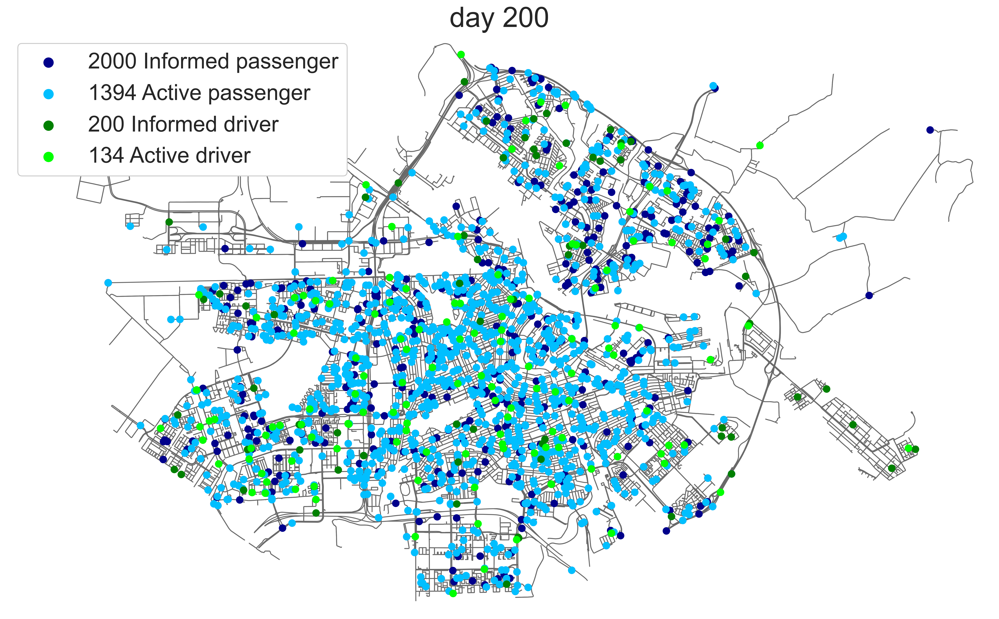

In [39]:
# fig, ax = plt.subplots(ncols=2, figsize=(16,8), facecolor='r')
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})

day = 200

inf_vehs = []
for veh in range(1,params.nV+1):
    if sim.res[day].veh_exp.loc[veh].INFORMED==True:
        inf_vehs.append(veh)

inf_pax = []
for pax in range(0,params.nP):
    if sim.res[day].pax_exp.loc[pax].INFORMED==True:
        inf_pax.append(pax)

vehs_pos = sim.vehicles.loc[inf_vehs].pos

veh_lxi=[]
veh_lyi=[]
for i in vehs_pos:
    veh_lxi.append(sim.inData.G.nodes[i]['x'])
    veh_lyi.append(sim.inData.G.nodes[i]['y'])

pax_pos = sim.passengers.loc[inf_pax].pos

pass_lxi=[]
pass_lyi=[]
for i in pax_pos:
    pass_lxi.append(sim.inData.G.nodes[i]['x'])
    pass_lyi.append(sim.inData.G.nodes[i]['y'])

#--------------------------------------------------------------------

active_vehs = []
for veh in range(1,params.nV+1):
    if sim.res[day].veh_exp.loc[veh].OUT==False:
        active_vehs.append(veh)

active_pax = []
for pax in range(0,params.nP):
    if sim.res[day].pax_exp.loc[pax].OUT==False:
        active_pax.append(pax)

vehs_pos = sim.vehicles.loc[active_vehs].pos

veh_lx=[]
veh_ly=[]
for i in vehs_pos:
    veh_lx.append(sim.inData.G.nodes[i]['x'])
    veh_ly.append(sim.inData.G.nodes[i]['y'])

pax_pos = sim.passengers.loc[active_pax].pos

pass_lx=[]
pass_ly=[]
for i in pax_pos:
    pass_lx.append(sim.inData.G.nodes[i]['x'])
    pass_ly.append(sim.inData.G.nodes[i]['y'])
#--------------------------------------------------------------------   

G = sim.inData.G

# fig, ax = ox.plot_graph(G, save=True, file_format='png')

ox.plot_graph(G, figsize=(15, 15), edge_linewidth=1, show=False, close=False, node_size=0, bgcolor='white', 
                        edge_color='dimgrey')# edge_color=(0.933, 0.65, 0.059)

scat = plt.scatter(x=pass_lxi, y=pass_lyi,c='darkblue',linewidths=5, label='{} Informed passenger'.format(len(inf_pax)), marker='.', alpha=1)
scat = plt.scatter(x=pass_lx, y=pass_ly,c='deepskyblue',linewidths=5, label='{} Active passenger'.format(len(active_pax)), marker='.', alpha=1)

scat = plt.scatter(x=veh_lxi, y=veh_lyi,c='green',linewidths=5, label='{} Informed driver'.format(len(inf_vehs)), marker='.', alpha=1)
scat = plt.scatter(x=veh_lx, y=veh_ly,c='lime',linewidths=5, label='{} Active driver'.format(len(active_vehs)), marker='.', alpha=1)

plt.legend(facecolor='white',framealpha=1, loc=2, fontsize= 23.5, markerscale=2)
plt.title('day 200', fontsize= 30)
plt.tight_layout()
plt.savefig('graph3.png')
# make legends readable and day as title to each plot

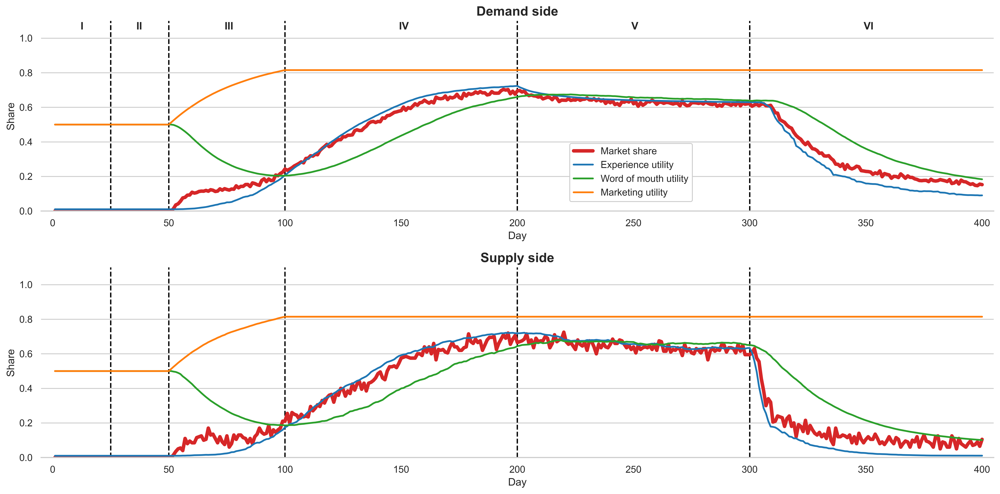

In [87]:
# with S-shaped curve nD=200 nP=2000 nV=200, with increased passenger sensitivity to changes in system
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,8))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].pax_exp.WOM_U.mean())
            ym.append(sim.res[d].pax_exp.MARKETING_U.mean())
            ye.append(sim.res[d].pax_exp.EXPERIENCE_U.mean())
            yms.append(sim.res[d].pax_exp.OUT.value_counts().get(False, 0)/params.nP)
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].veh_exp.WOM_U.mean())
            ym.append(sim.res[d].veh_exp.MARKETING_U.mean())
            ye.append(sim.res[d].veh_exp.EXPERIENCE_U.mean())
            yms.append(sim.res[d].veh_exp.OUT.value_counts().get(False, 0)/params.nV)
    
    lx = [i for i in range(1,len(ye)+1)]
    sns.lineplot(x=lx, y=yms, label = 'Market share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ye, label = 'Experience utility', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=yw, label = 'Word of mouth utility', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ym, label = 'Marketing utility', color='C1', lw=2, ax=ax[ax_n])#, marker='o')
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.05))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
plt.savefig('Fig1.png')

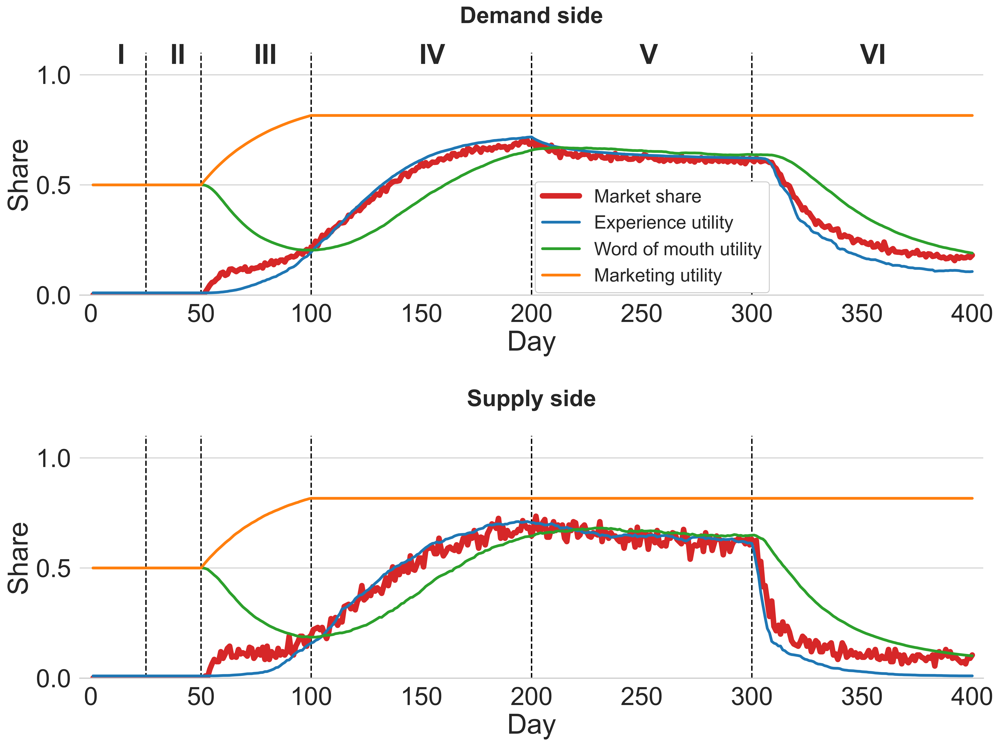

In [176]:
#AAMAS
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=2.5)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,12))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].pax_exp.WOM_U.mean())
            ym.append(sim.res[d].pax_exp.MARKETING_U.mean())
            ye.append(sim.res[d].pax_exp.EXPERIENCE_U.mean())
            yms.append(sim.res[d].pax_exp.OUT.value_counts().get(False, 0)/params.nP)
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].veh_exp.WOM_U.mean())
            ym.append(sim.res[d].veh_exp.MARKETING_U.mean())
            ye.append(sim.res[d].veh_exp.EXPERIENCE_U.mean())
            yms.append(sim.res[d].veh_exp.OUT.value_counts().get(False, 0)/params.nV)
    
    lx = [i for i in range(1,len(ye)+1)]
    sns.lineplot(x=lx, y=yms, label = 'Market share', color='C3', lw=6, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ye, label = 'Experience utility', color='C0', lw=3, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=yw, label = 'Word of mouth utility', color='C2', lw=3, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ym, label = 'Marketing utility', color='C1', lw=3, ax=ax[ax_n])#, marker='o')
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=25, x=0.5, y=1.1);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=25, x=0.5, y=1.1)
ax[0].legend(frameon=True,framealpha=1, loc=(0.504,0.01), fontsize=20)#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
plt.savefig('Fig_aamas1.png')

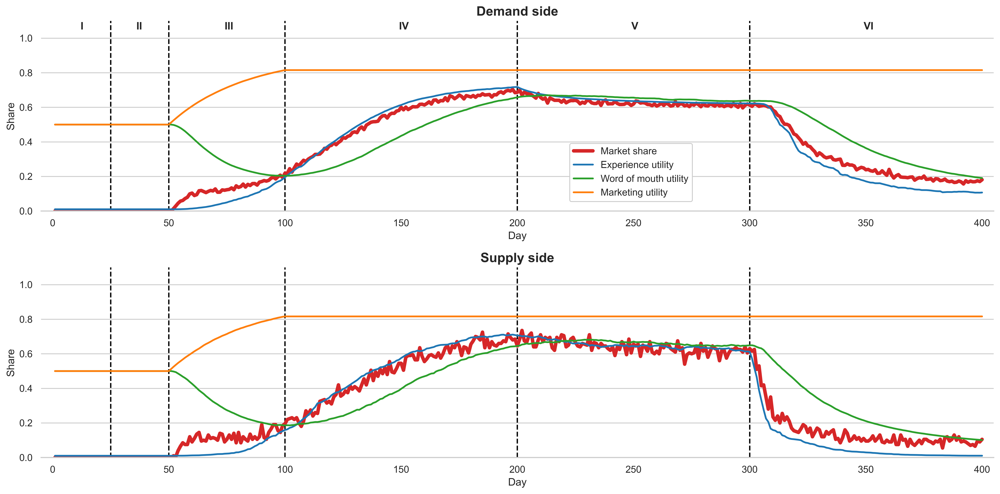

In [26]:
# with S-shaped curve nD=200 nP=2000 nV=200, with increased passenger sensitivity to changes in system
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,8))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].pax_exp.WOM_U.mean())
            ym.append(sim.res[d].pax_exp.MARKETING_U.mean())
            ye.append(sim.res[d].pax_exp.EXPERIENCE_U.mean())
            yms.append(sim.res[d].pax_exp.OUT.value_counts().get(False, 0)/params.nP)
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].veh_exp.WOM_U.mean())
            ym.append(sim.res[d].veh_exp.MARKETING_U.mean())
            ye.append(sim.res[d].veh_exp.EXPERIENCE_U.mean())
            yms.append(sim.res[d].veh_exp.OUT.value_counts().get(False, 0)/params.nV)
    
    lx = [i for i in range(1,len(ye)+1)]
    sns.lineplot(x=lx, y=yms, label = 'Market share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ye, label = 'Experience utility', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=yw, label = 'Word of mouth utility', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ym, label = 'Marketing utility', color='C1', lw=2, ax=ax[ax_n])#, marker='o')
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.05))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
# plt.savefig('Fig1.png')

In [ ]:
1-Market share and bold 

grid may pass from 0.5, 0.25, ...
y axis share
set limit to x

<AxesSubplot:>

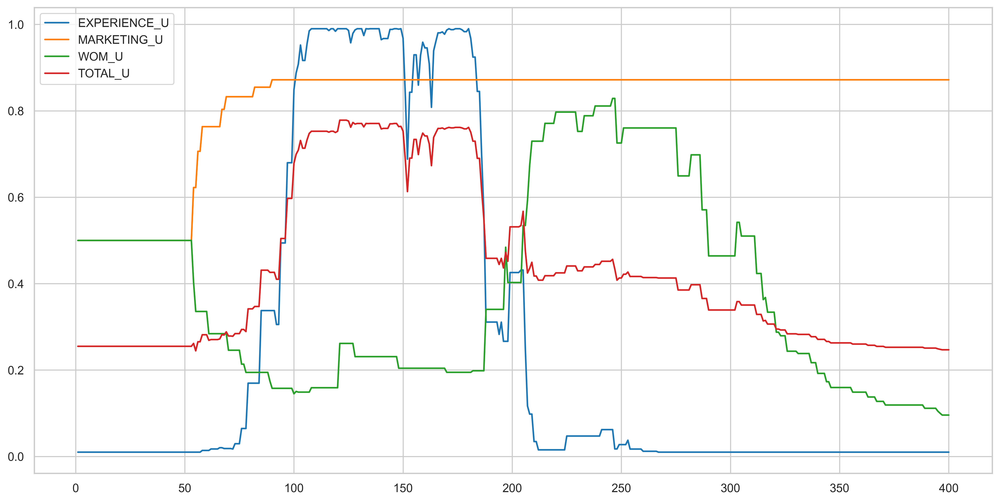

In [94]:
fig, ax = plt.subplots(figsize=(16,8))

veh_id = 5
x = []
ye = []
ym = []
yw = []
yu = []

for d in range(0,sim.params.nD):
    ye.append(sim.res[d].veh_exp.loc[veh_id].EXPERIENCE_U)
    ym.append(sim.res[d].veh_exp.loc[veh_id].MARKETING_U)
    yw.append(sim.res[d].veh_exp.loc[veh_id].WOM_U)
    yu.append((0.5*ye[-1])+(0.25*ym[-1])+(0.25*yw[-1]))
    
x = [i for i in range(1,len(ye)+1)]
sns.lineplot(x=x, y=ye, label = 'EXPERIENCE_U')#, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=ym, label = 'MARKETING_U')#, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yw, label = 'WOM_U')#, ax=ax[2])#, marker='o')
sns.lineplot(x=x, y=yu, label = 'TOTAL_U')#, ax=ax[3])#, marker='o')

<AxesSubplot:>

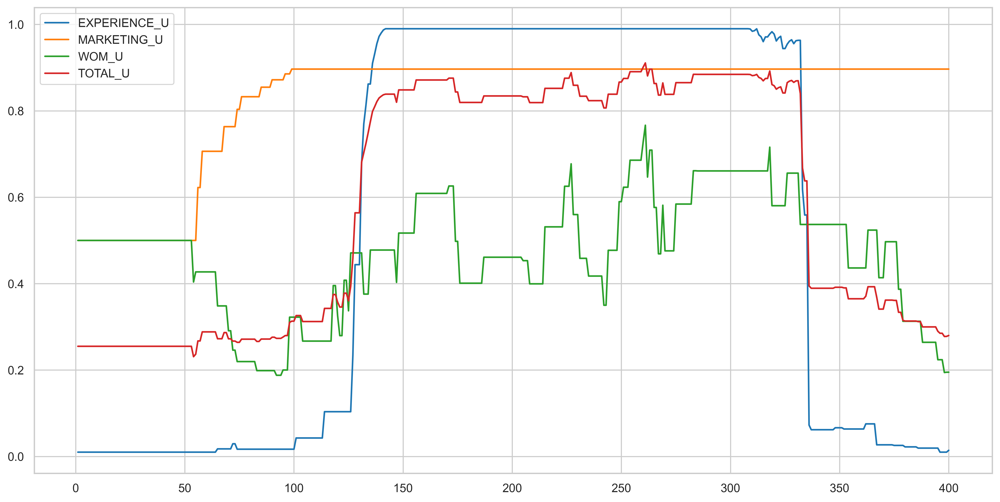

In [92]:
fig, ax = plt.subplots(figsize=(16,8))

pax_id = 3
x = []
ye = []
ym = []
yw = []
yu = []

for d in range(0,sim.params.nD):
    ye.append(sim.res[d].pax_exp.loc[pax_id].EXPERIENCE_U)
    ym.append(sim.res[d].pax_exp.loc[pax_id].MARKETING_U)
    yw.append(sim.res[d].pax_exp.loc[pax_id].WOM_U)
    yu.append((0.5*ye[-1])+(0.25*ym[-1])+(0.25*yw[-1]))
    
x = [i for i in range(1,len(ye)+1)]
sns.lineplot(x=x, y=ye, label = 'EXPERIENCE_U')#, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=ym, label = 'MARKETING_U')#, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yw, label = 'WOM_U')#, ax=ax[2])#, marker='o')
sns.lineplot(x=x, y=yu, label = 'TOTAL_U')#, ax=ax[3])#, marker='o')

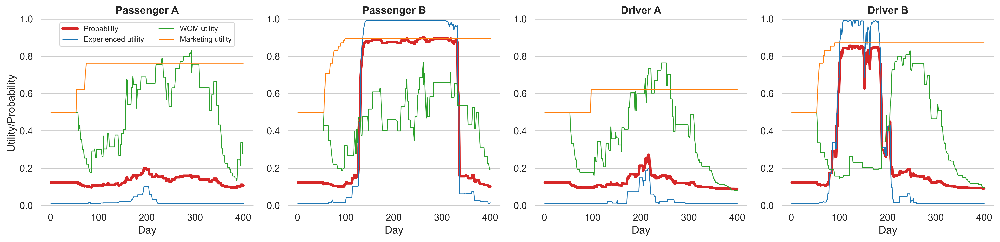

In [95]:
# individual assessment of agents

sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(ncols=4, figsize=(16,4))
sns.despine(left=True)

ids = [2,3,3,5]
n = 0

for i in range(0,4):
    
    x = []; ye = []; ym = []; yw = []; yu = []; yp = []
    if i<2:
        pax_id = ids[i]
        for d in range(0,sim.params.nD):
            ye.append(sim.res[d].pax_exp.loc[pax_id].EXPERIENCE_U)
            ym.append(sim.res[d].pax_exp.loc[pax_id].MARKETING_U)
            yw.append(sim.res[d].pax_exp.loc[pax_id].WOM_U)
            u = (params.d2d.B_Experience*ye[-1])+(params.d2d.B_Marketing*ym[-1])+(params.d2d.B_WOM*yw[-1])
            yu.append(u)
            yp.append((math.exp(params.d2d.m*u))/(math.exp(params.d2d.m*u) + math.exp(params.d2d.m*0.5)))
    else:
        veh_id = ids[i]
        for d in range(0,sim.params.nD):
            ye.append(sim.res[d].veh_exp.loc[veh_id].EXPERIENCE_U)
            ym.append(sim.res[d].veh_exp.loc[veh_id].MARKETING_U)
            yw.append(sim.res[d].veh_exp.loc[veh_id].WOM_U)
            u = (params.d2d.B_Experience*ye[-1])+(params.d2d.B_Marketing*ym[-1])+(params.d2d.B_WOM*yw[-1])
            yu.append(u)
            yp.append((math.exp(params.d2d.m*u))/(math.exp(params.d2d.m*u) + math.exp(params.d2d.m*0.5)))

    x = [i for i in range(1,len(ye)+1)]
    sns.lineplot(x=x, y=yp, label = 'Probability', color='C3', linewidth=3, ax=ax[n])#, marker='o')
    sns.lineplot(x=x, y=ye, label = 'Experienced utility', color='C0', lw=1, ax=ax[n])#, marker='o')
    sns.lineplot(x=x, y=yw, label = 'WOM utility', color='C2',lw=1, ax=ax[n])#, marker='o')
    sns.lineplot(x=x, y=ym, label = 'Marketing utility', color='C1',lw=1, ax=ax[n])#, marker='o')
    # sns.lineplot(x=x, y=yu, label = 'TOTAL_U', ax=ax[n])#, marker='o')
    
    ax[n].set(xlabel='Day', ylim=(0,1))
    ax[n].grid(axis='x')
    n += 1
ax[0].legend(loc='upper center', frameon=True, ncol=2, fontsize=8.5)
ax[0].set(ylabel='Utility/Probability')
ax[1].get_legend().set_visible(False);ax[2].get_legend().set_visible(False);ax[3].get_legend().set_visible(False)
ax[0].set_title('Passenger A',fontweight='bold');ax[1].set_title('Passenger B',fontweight='bold');ax[2].set_title('Driver A',fontweight='bold');ax[3].set_title('Driver B',fontweight='bold')

plt.tight_layout()
plt.savefig('Fig2.png')

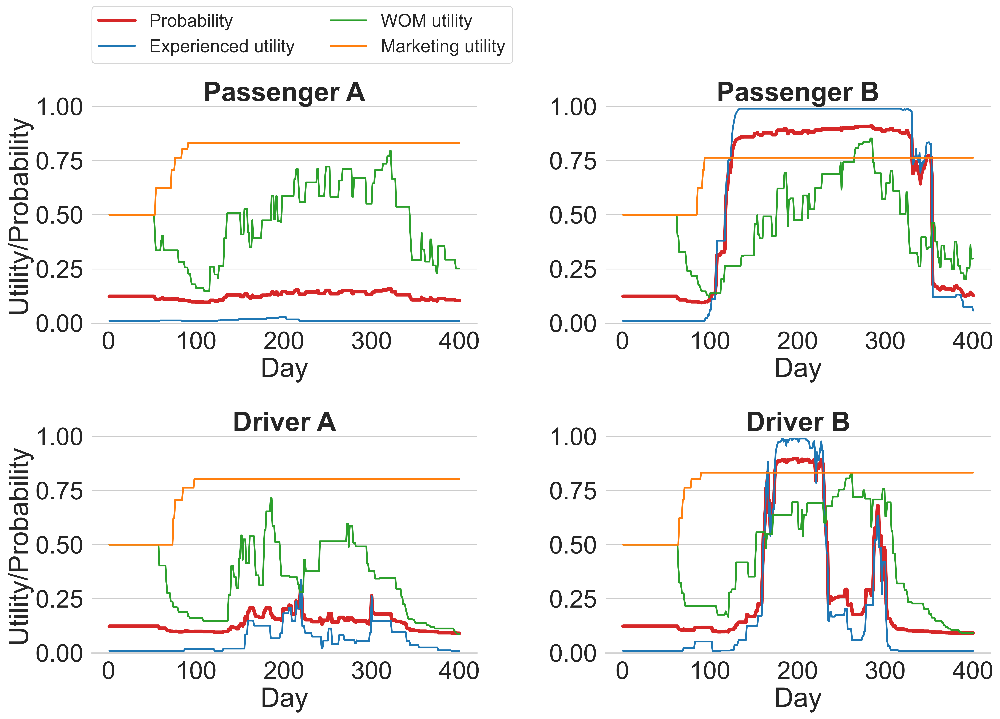

In [132]:
# AAMAS

sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=2.5)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16,12))
sns.despine(left=True)

ids = [2,3,21,5]
n = 0

for i in range(0,4):
    
    x = []; ye = []; ym = []; yw = []; yu = []; yp = []
    if i<2:
        pax_id = ids[i]
        for d in range(0,sim.params.nD):
            ye.append(sim.res[d].pax_exp.loc[pax_id].EXPERIENCE_U)
            ym.append(sim.res[d].pax_exp.loc[pax_id].MARKETING_U)
            yw.append(sim.res[d].pax_exp.loc[pax_id].WOM_U)
            u = (params.d2d.B_Experience*ye[-1])+(params.d2d.B_Marketing*ym[-1])+(params.d2d.B_WOM*yw[-1])
            yu.append(u)
            yp.append((math.exp(params.d2d.m*u))/(math.exp(params.d2d.m*u) + math.exp(params.d2d.m*0.5)))
    else:
        veh_id = ids[i]
        for d in range(0,sim.params.nD):
            ye.append(sim.res[d].veh_exp.loc[veh_id].EXPERIENCE_U)
            ym.append(sim.res[d].veh_exp.loc[veh_id].MARKETING_U)
            yw.append(sim.res[d].veh_exp.loc[veh_id].WOM_U)
            u = (params.d2d.B_Experience*ye[-1])+(params.d2d.B_Marketing*ym[-1])+(params.d2d.B_WOM*yw[-1])
            yu.append(u)
            yp.append((math.exp(params.d2d.m*u))/(math.exp(params.d2d.m*u) + math.exp(params.d2d.m*0.5)))

    if n<2:
        
        x = [i for i in range(1,len(ye)+1)]
        sns.lineplot(x=x, y=yp, label = 'Probability', color='C3', linewidth=4, ax=ax[0,n])#, marker='o')
        sns.lineplot(x=x, y=ye, label = 'Experienced utility', color='C0', lw=2, ax=ax[0,n])#, marker='o')
        sns.lineplot(x=x, y=yw, label = 'WOM utility', color='C2',lw=2, ax=ax[0,n])#, marker='o')
        sns.lineplot(x=x, y=ym, label = 'Marketing utility', color='C1',lw=2, ax=ax[0,n])#, marker='o')
        # sns.lineplot(x=x, y=yu, label = 'TOTAL_U', ax=ax[n])#, marker='o')

        ax[0,n].set(xlabel='Day', ylim=(0,1))
        ax[0,n].grid(axis='x')
        n += 1
        
    else:
        
        x = [i for i in range(1,len(ye)+1)]
        sns.lineplot(x=x, y=yp, label = 'Probability', color='C3', linewidth=4, ax=ax[1,n-2])#, marker='o')
        sns.lineplot(x=x, y=ye, label = 'Experienced utility', color='C0', lw=2, ax=ax[1,n-2])#, marker='o')
        sns.lineplot(x=x, y=yw, label = 'WOM utility', color='C2',lw=2, ax=ax[1,n-2])#, marker='o')
        sns.lineplot(x=x, y=ym, label = 'Marketing utility', color='C1',lw=2, ax=ax[1,n-2])#, marker='o')
        # sns.lineplot(x=x, y=yu, label = 'TOTAL_U', ax=ax[n])#, marker='o')

        ax[1,n-2].set(xlabel='Day', ylim=(0,1))
        ax[1,n-2].grid(axis='x')
        n += 1
    
    
ax[0,0].legend(loc=(0,1.2), frameon=True, ncol=2, fontsize=20)
ax[0,0].set(ylabel='Utility/Probability'); ax[1,0].set(ylabel='Utility/Probability')
ax[0,1].get_legend().set_visible(False);ax[1,0].get_legend().set_visible(False);ax[1,1].get_legend().set_visible(False)
ax[0,0].set_title('Passenger A',fontweight='bold');ax[0,1].set_title('Passenger B',fontweight='bold');ax[1,0].set_title('Driver A',fontweight='bold');ax[1,1].set_title('Driver B',fontweight='bold')

plt.tight_layout()
plt.savefig('Fig_aamas2.png')

In [7]:
sim
# increase the font size for plots

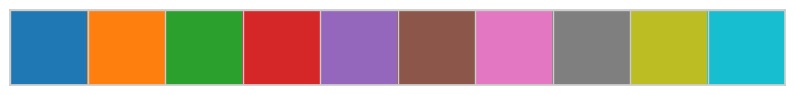

In [181]:
sns.palplot(sns.color_palette("tab10", 10))

In [107]:
def smooth(y,w=11,o=1,d=51):
    from scipy.signal import savgol_filter
    nans = [float('nan') for i in range(0,51)] 
    y = nans + list(savgol_filter(y[d:],w,o))
    for i in range(0,len(y)):
        if y[i]<0:
            y[i] = 0
    return y

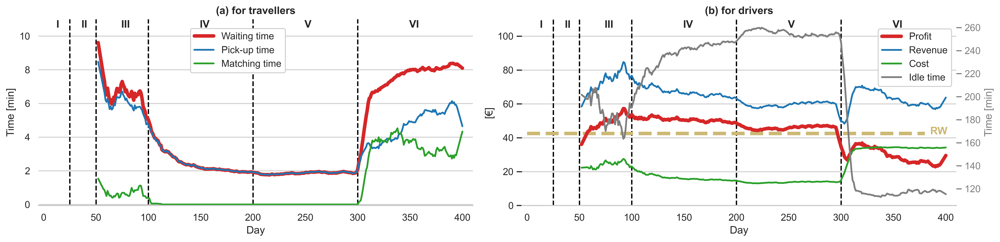

In [12]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')

fig, ax = plt.subplots(ncols=2, figsize=(16,4))
sns.despine(left=True)
    

x = []
yw = []
yp = []
yi = []
ym = []
yr = []
yprof = []
yc = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    yw.append(df[df.OUT==False].ACTUAL_WT.mean()) # Waiting time per passenger
    ym.append(df[df.OUT==False].MATCHING_T.mean()) # Matching time per passenger
    # yprof.append(df.plat_profit.sum())
    
    df = sim.res[d].veh_exp
    yp.append(df[df.OUT==False].ARRIVES_AT_PICKUP.mean()/(df[df.OUT==False].nRIDES.mean()*60))
    yi.append(df[df.OUT==False].IDLE_TIME.mean()/60)
    yr.append(df[df.OUT==False].REVENUE.mean())
    yprof.append(df[df.OUT==False].ACTUAL_INC.mean())
    yc.append(df[df.OUT==False].COST.mean())



yw = smooth(yw)
ym = smooth(ym)
yp = smooth(yp)
yi = smooth(yi)
yr = smooth(yr)
yprof = smooth(yprof)
yc = smooth(yc)

x = [i for i in range(1,len(yp)+1)]
sns.lineplot(x=x, y=yw, label = 'Waiting time', color='C3',lw=4, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yp, label = 'Pick-up time', color='C0',lw=2, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=ym, label = 'Matching time', color='C2',lw=2, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yprof, label = 'Profit', color='C3',lw=4, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yr, label = 'Revenue', color='C0',lw=2, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yc, label = 'Cost', color='C2',lw=2, ax=ax[1])#, marker='o')ax.twinx()
ax11 = ax[1].twinx()
sns.lineplot(x=x, y=yi, label = 'Idle time', color='C7',lw=2, ax=ax11)#, marker='o')
ax11.set(ylabel='Time [min]')
ax11.grid(b=None)

lines, labels = ax[1].get_legend_handles_labels()
lines2, labels2 = ax11.get_legend_handles_labels()
ax[1].legend(lines + lines2, labels + labels2,framealpha=1, loc=(0.82,0.64))
ax11.legend().remove()
# ax11.spines['right'].set_color('C7')
ax11.tick_params(axis='y', colors='C7')
ax11.yaxis.label.set_color('C7')

for i in [0,1]:
    ax[i].grid(axis='x')

ax[0].vlines([25, 50, 100, 200, 300], 0, 11, linestyles='dashed', colors='black')
ax[1].vlines([25, 50, 100, 200, 300], 0, 110, linestyles='dashed', colors='black')
ax[1].hlines([params.d2d.res_wage], 0, 380, linestyles='dashed', colors='y', lw=4)
ax[1].annotate('RW', xy =(385,42), fontweight='bold', color='y')

value = ['I','II','III','IV','V','VI']
for i in range(0,6):
    coords = [(12,10.5),(36,10.5),(74,10.5),(149,10.5),(249,10.5),(349,10.5)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')
for i in range(0,6):
    coords = [(12,105),(36,105),(74,105),(149,105),(249,105),(349,105)]
    ax[1].annotate(value[i], xy =coords[i], fontweight='bold')    
    
ax[0].set(xlabel='Day', ylabel='Time [min]', ylim=(-0.06,11), xlim=(-5,410)); ax[1].set(xlabel='Day', ylabel='[€]', ylim=(0,110),xlim=(-5,410))
ax[0].legend(loc=(0.35,0.713),framealpha=1)
sns.despine(left=True)

ax[0].set_title('(a) for travellers',fontweight='bold')
ax[1].set_title('(b) for drivers',fontweight='bold')

plt.tight_layout()
plt.savefig('Fig3.png')

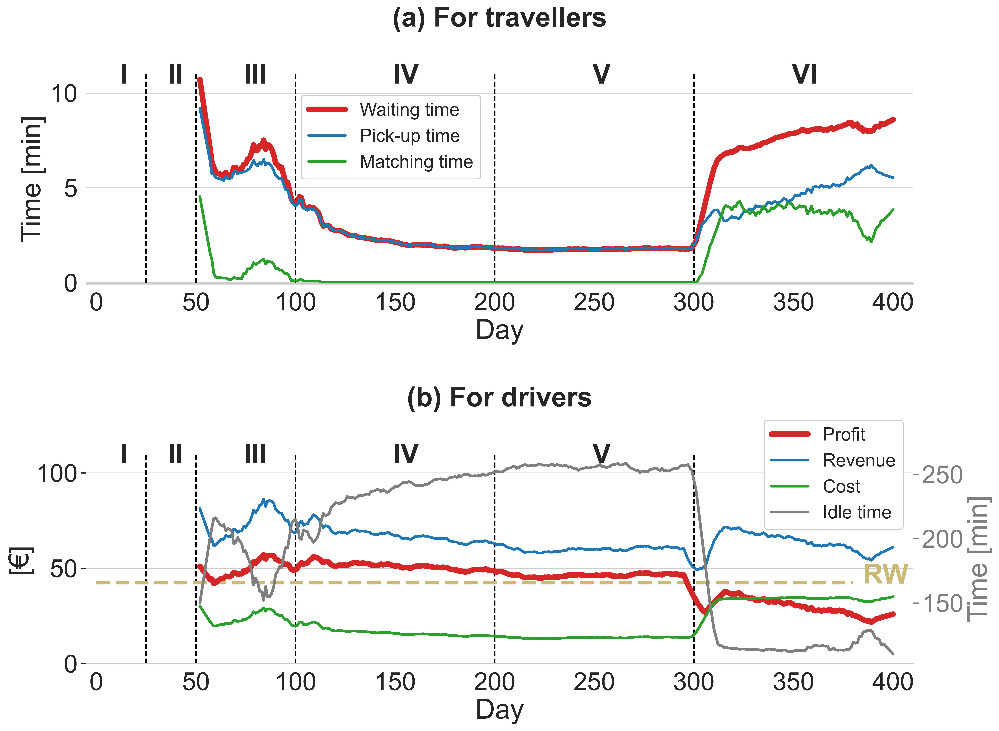

In [131]:
#AAMAS
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=2.5)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')

fig, ax = plt.subplots(nrows=2, figsize=(16,12))
sns.despine(left=True)
    

x = []
yw = []
yp = []
yi = []
ym = []
yr = []
yprof = []
yc = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    yw.append(df[df.OUT==False].ACTUAL_WT.mean()) # Waiting time per passenger
    ym.append(df[df.OUT==False].MATCHING_T.mean()) # Matching time per passenger
    # yprof.append(df.plat_profit.sum())
    
    df = sim.res[d].veh_exp
    yp.append(df[df.OUT==False].ARRIVES_AT_PICKUP.mean()/(df[df.OUT==False].nRIDES.mean()*60))
    yi.append(df[df.OUT==False].IDLE_TIME.mean()/60)
    yr.append(df[df.OUT==False].REVENUE.mean())
    yprof.append(df[df.OUT==False].ACTUAL_INC.mean())
    yc.append(df[df.OUT==False].COST.mean())



yw = smooth(yw)
ym = smooth(ym)
yp = smooth(yp)
yi = smooth(yi)
yr = smooth(yr)
yprof = smooth(yprof)
yc = smooth(yc)

x = [i for i in range(1,len(yp)+1)]
sns.lineplot(x=x, y=yw, label = 'Waiting time', color='C3',lw=6, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yp, label = 'Pick-up time', color='C0',lw=3, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=ym, label = 'Matching time', color='C2',lw=3, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yprof, label = 'Profit', color='C3',lw=6, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yr, label = 'Revenue', color='C0',lw=3, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yc, label = 'Cost', color='C2',lw=3, ax=ax[1])#, marker='o')ax.twinx()
ax11 = ax[1].twinx()
sns.lineplot(x=x, y=yi, label = 'Idle time', color='C7',lw=3, ax=ax11)#, marker='o')
ax11.set(ylabel='Time [min]')
ax11.grid(b=None)

lines, labels = ax[1].get_legend_handles_labels()
lines2, labels2 = ax11.get_legend_handles_labels()
ax[1].legend(lines + lines2, labels + labels2,framealpha=1, loc=(0.82,0.64), fontsize=20)
ax11.legend().remove()
# ax11.spines['right'].set_color('C7')
ax11.tick_params(axis='y', colors='C7')
ax11.yaxis.label.set_color('C7')

for i in [0,1]:
    ax[i].grid(axis='x')

ax[0].vlines([25, 50, 100, 200, 300], 0, 11, linestyles='dashed', colors='black')
ax[1].vlines([25, 50, 100, 200, 300], 0, 110, linestyles='dashed', colors='black')
ax[1].hlines([params.d2d.res_wage], 0, 380, linestyles='dashed', colors='y', lw=4)
ax[1].annotate('RW', xy =(385,42), fontweight='bold', color='y')

value = ['I','II','III','IV','V','VI']
for i in range(0,6):
    coords = [(12,10.5),(36,10.5),(74,10.5),(149,10.5),(249,10.5),(349,10.5)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')
for i in range(0,6):
    coords = [(12,105),(36,105),(74,105),(149,105),(249,105),(349,105)]
    ax[1].annotate(value[i], xy =coords[i], fontweight='bold')    
    
ax[0].set(xlabel='Day', ylabel='Time [min]', ylim=(-0.06,11), xlim=(-5,410)); ax[1].set(xlabel='Day', ylabel='[€]', ylim=(0,110),xlim=(-5,410))
ax[0].legend(loc=(0.26,0.5),framealpha=1, fontsize=20)
sns.despine(left=True)


ax[0].set_title('(a) For travellers',fontweight='bold', x=0.5, y=1.2)
ax[1].set_title('(b) For drivers',fontweight='bold', x=0.5, y=1.2)

plt.tight_layout()
plt.savefig('Fig_aamas3.png')

,nRIDES,nREJECTED,nDAYS_WORKED,DRIVING_TIME,IDLE_TIME,PICKUP_DIST,DRIVING_DIST,REVENUE,COST,COMMISSION,...,ARRIVES_AT_PICKUP,MEETS_TRAVELLER_AT_PICKUP,DEPARTS_FROM_PICKUP,ARRIVES_AT_DROPOFF,CONTINUES_SHIFT,STARTS_REPOSITIONING,REPOSITIONED,DECIDES_NOT_TO_DRIVE,ENDS_SHIFT,pkm
veh,,,,,,,,,,,,,,,,,,,,,
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
196,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
197,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
198,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


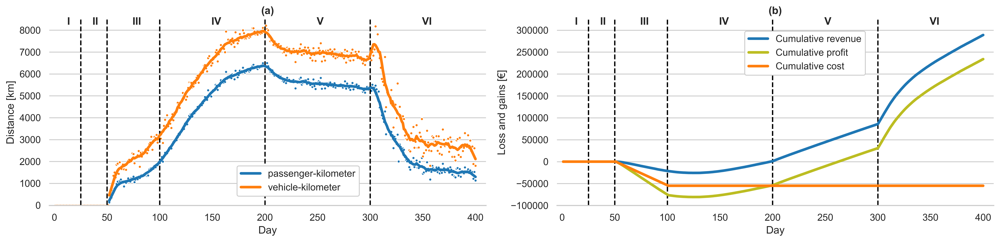

In [11]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')

fig, ax = plt.subplots(ncols=2,figsize=(16,4))
sns.despine(left=True)

x = []
ypkm = []
yvkm = []

for d in range(0,sim.params.nD):
    df = sim.res[d].veh_exp
    df['pkm'] = df.DRIVING_DIST-df.PICKUP_DIST
    ypkm.append(df.pkm.sum())
    yvkm.append(df.DRIVING_DIST.sum())

x = [i for i in range(1,len(ypkm)+1)]

ypkms = smooth(ypkm)
yvkms = smooth(yvkm)
sns.lineplot(x=x, y=ypkms, lw=3, label = 'passenger-kilometer', ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yvkms, lw=3, label = 'vehicle-kilometer', color='C1', ax=ax[0])#, marker='o')
lines, labels = ax[0].get_legend_handles_labels()

sns.scatterplot(x=x, y=ypkm, s=10,label = 'passenger-kilometer',ax=ax[0])#, marker='o')
sns.scatterplot(x=x, y=yvkm, s=10,label = 'vehicle-kilometer', color='C1',ax=ax[0])#, marker='o')

ax[0].set(ylim=(-10,8500), xlim=(-5,410), xlabel='Day', ylabel='Distance [km]')
ax[0].legend(lines, labels ,framealpha=1, loc=(0.43,0.05))
ax[0].grid(axis='x')
ax[0].vlines([25, 50, 100, 200, 300], 0, 8500, linestyles='dashed', colors='black')

value = ['I','II','III','IV','V','VI']
for i in range(0,6):
    coords = [(12,8250),(36,8250),(74,8250),(149,8250),(249,8250),(349,8250)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')
#-----------------------------------------------------------------------------------
x = []
ypr = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    ypr.append(df[df.OUT==False].plat_profit.sum())
x = [i for i in range(1,len(ypr)+1)]

df = pd.Series(ypr).to_frame()
df.columns = ['income']
marketing_costs = 0.5
df['marketing costs']=df.apply(lambda x: -marketing_costs*2200 if x.name >50 and x.name<=100 else 0, axis = 1).astype(int)
df['profit']=df.income + df['marketing costs']

sns.lineplot(x=x, y=df.income.cumsum(), lw=3, label = 'Cumulative revenue', color='C0',ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=df.profit.cumsum(), lw=3, label = 'Cumulative profit', color='C8',ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=df['marketing costs'].astype(int).cumsum(), lw=3, label = 'Cumulative cost', color='C1',ax=ax[1])#, marker='o')

ax[1].grid(axis='x')
ax[1].vlines([25, 50, 100, 200, 300], -100000, 325000, linestyles='dashed', colors='black')
# sns.lineplot(x=x, y=ypr, label = 'plat_profit')#, marker='o')
sns.despine(left=True)
ax[1].set(xlim=(-5,410), ylim=(-100000,325000), xlabel='Day', ylabel='Loss and gains [€]')
ax[1].legend(framealpha=1, loc=(0.43,0.7))

value = ['I','II','III','IV','V','VI']
for i in range(0,6):
    coords = [(12,312500),(36,312500),(74,312500),(149,312500),(249,312500),(349,312500)]
    ax[1].annotate(value[i], xy =coords[i], fontweight='bold')
    

ax[0].set_title('(a)',fontweight='bold')
ax[1].set_title('(b)',fontweight='bold')


plt.tight_layout()
plt.savefig('Fig4.png')

<AxesSubplot:>

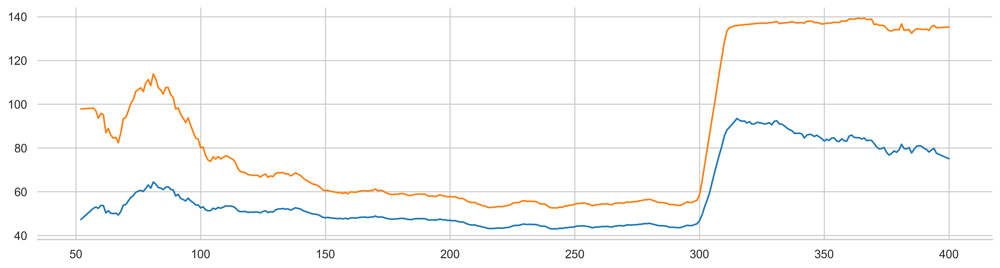

In [133]:
fig, ax = plt.subplots(figsize=(16,4))
sns.despine(left=True)

x = []
ypkm = []
yvkm = []

for d in range(0,sim.params.nD):
    df = sim.res[d].veh_exp
    df['pkm'] = df.DRIVING_DIST-df.PICKUP_DIST
    ypkm.append(df[df.OUT==False].pkm.mean())
    yvkm.append(df[df.OUT==False].DRIVING_DIST.mean())

x = [i for i in range(1,len(ypkm)+1)]

ypkms = smooth(ypkm)
yvkms = smooth(yvkm)

sns.lineplot(x=x, y=ypkms)
sns.lineplot(x=x, y=yvkms)

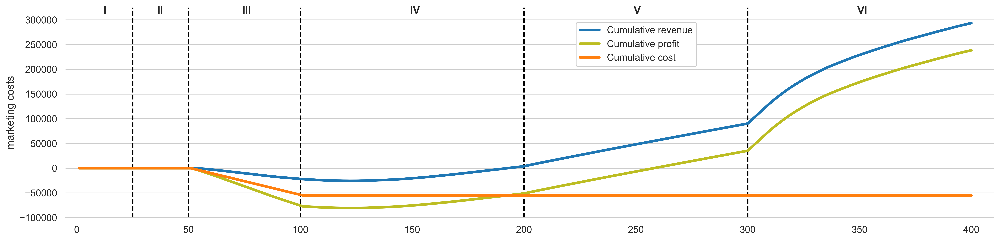

In [101]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')

fig, ax = plt.subplots(figsize=(16,4))
sns.despine(left=True)

x = []
ypr = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    ypr.append(df[df.OUT==False].plat_profit.sum())
x = [i for i in range(1,len(ypr)+1)]

df = pd.Series(ypr).to_frame()
df.columns = ['income']
marketing_costs = 0.5
df['marketing costs']=df.apply(lambda x: -marketing_costs*2200 if x.name >50 and x.name<=100 else 0, axis = 1).astype(int)
df['profit']=df.income + df['marketing costs']

sns.lineplot(x=x, y=df.income.cumsum(), lw=3, label = 'Cumulative revenue', color='C0')#, marker='o')
sns.lineplot(x=x, y=df.profit.cumsum(), lw=3, label = 'Cumulative profit', color='C8')#, marker='o')
sns.lineplot(x=x, y=df['marketing costs'].astype(int).cumsum(), lw=3, label = 'Cumulative cost', color='C1')#, marker='o')

ax.grid(axis='x')
ax.vlines([25, 50, 100, 200, 300], -100000, 325000, linestyles='dashed', colors='black')
# sns.lineplot(x=x, y=ypr, label = 'plat_profit')#, marker='o')
sns.despine(left=True)
ax.set(xlim=(-5,410), ylim=(-100000,325000))
ax.legend(framealpha=1, loc=(0.55,0.72))

value = ['I','II','III','IV','V','VI']
for i in range(0,6):
    coords = [(12,312500),(36,312500),(74,312500),(149,312500),(249,312500),(349,312500)]
    ax.annotate(value[i], xy =coords[i], fontweight='bold')

plt.tight_layout()
plt.savefig('Fig5.png')

In [368]:
(300000-250000)/4

12500.0

<AxesSubplot:>

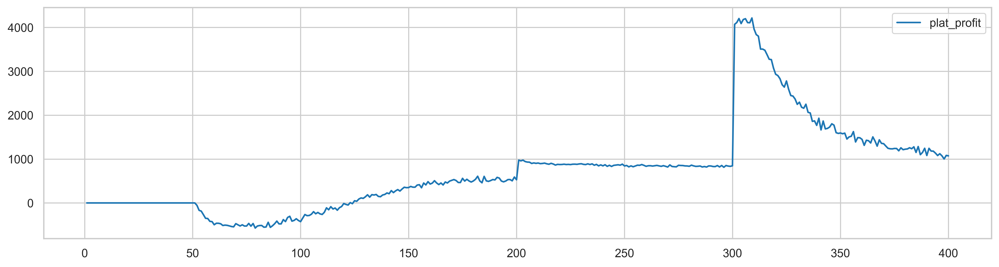

In [100]:
fig, ax = plt.subplots(figsize=(16,4))
sns.lineplot(x=x, y=ypr, label = 'plat_profit')#, marker='o')

<AxesSubplot:>

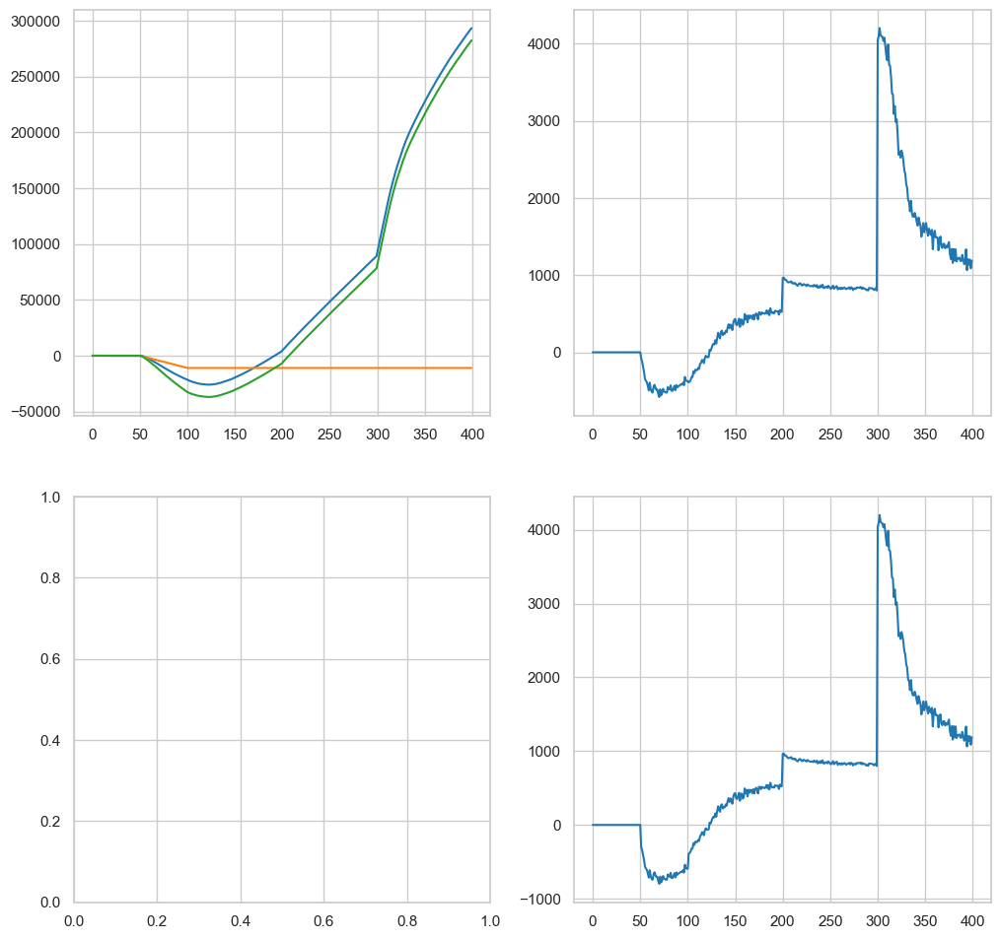

In [300]:
df = pd.Series(ypp).to_frame()
df.columns = ['income']
marketing_costs = 0.1
df['marketing costs']=df.apply(lambda x: -marketing_costs*2200 if x.name >50 and x.name<=100 else 0, axis = 1).astype(int)
fig, ax = plt.subplots(2,2, sharey = False, figsize = (12,12))
ax = ax.flatten()
df.income.cumsum().plot(ax = ax[0])
df.income.plot(ax = ax[1])
df['marketing costs'].astype(int).cumsum().plot(ax = ax[0])
df['profit']=df.income + df['marketing costs']
df.profit.cumsum().plot(ax=ax[0])
df.profit.plot(ax=ax[3])


In [247]:
ax.legend()

TypeError: 'Legend' object is not subscriptable

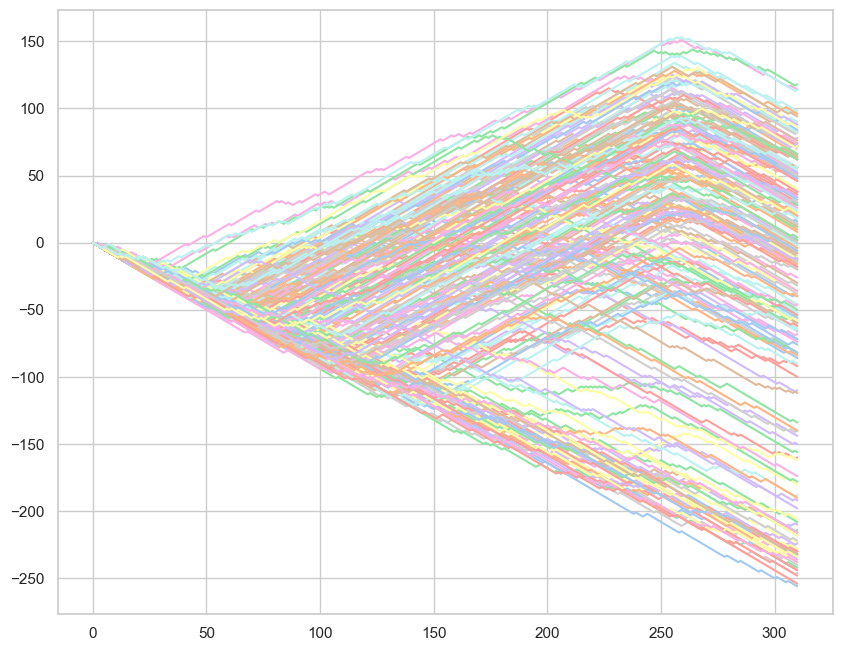

In [639]:
fig, ax = plt.subplots(figsize=(10,8))
for veh in range(1,sim.params.nV+1):
    ly = [0]
    for run_id in range(50, len(sim.res)):
        if sim.res[run_id].veh_exp.loc[veh].mu==0: ly.append(ly[-1]-1)
        else: ly.append(ly[-1]+1)
    lx = [i for i in range(0,len(ly),1)]
    sns.lineplot(x=lx, y=ly)
#ax.legend("drivers'working status")

In [155]:
RD = [-0.43, -0.31, -0.47, -0.47, -0.33, -0.60, -0.80, -0.99, -0.99, -0.99, -0.99, -0.99, -0.34
      , -0.34, -0.34, -0.34, -0.34, -0.34, -0.34, -0.61, -0.61, -0.61, -0.61, -0.61, -0.61, -0.61,
      -0.61, -0.61, -0.61, -0.61, -0.61, -0.61, -0.61, -0.61, -0.61, -0.61, -0.61, -0.61, -0.61]
SMP = list(np.arange(1.2, 5.1, 0.1))

pr = [100]
smp = [1]

for i in range(0,len(RD)):
    dp = (SMP[i]-smp[-1])/smp[-1]
    dd = dp*(RD[i])
    pr.append((1+dd)*pr[-1])
    smp.append(SMP[i])

In [150]:
pr

[100,
 91.4,
 89.03883333333333,
 85.81973705128205,
 82.93864587884615,
 81.11399566951152,
 78.07222083190484,
 74.39823396922696]

<AxesSubplot:>

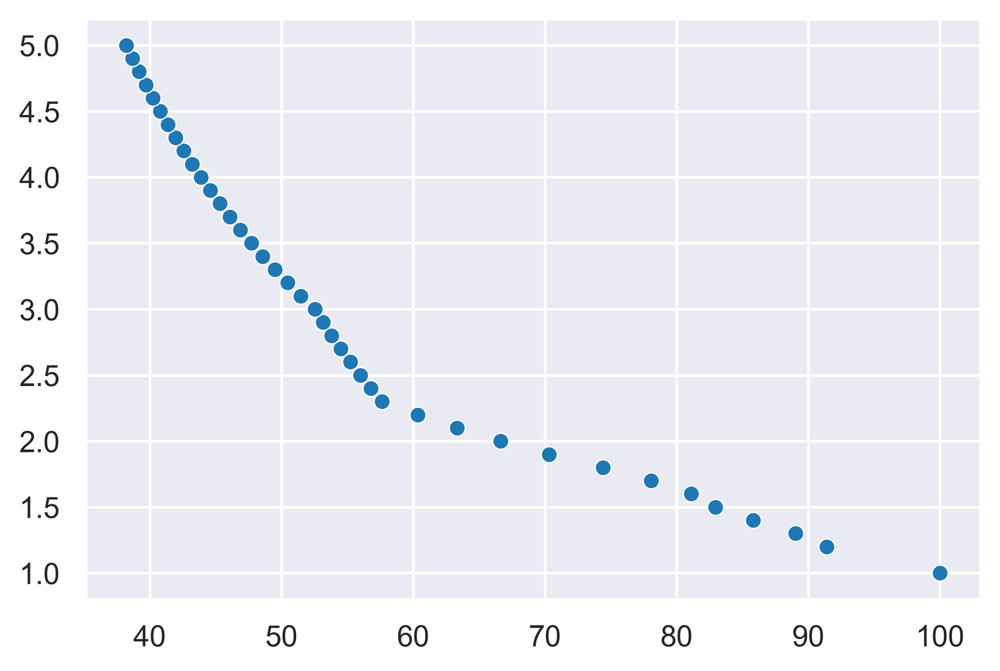

In [158]:
sns.scatterplot(x=pr, y=smp)

In [173]:
l = []
for i in range(1, 10001):
    if random.random() < 0.6:
        l.append(i)
len(l)/10000        

0.5981